## Import Libraries

In [1]:
import sys
import os
import pandas as pd
import geopandas as gpd
# import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
# from matplotlib.animation import FuncAnimation
# from matplotlib.colors import LinearSegmentedColormap
# import folium
import osmnx as ox
# from folium.plugins import HeatMap, TimestampedGeoJson
# import plotly.express as px
# import plotly.graph_objects as go
# from datetime import datetime
import warnings
# import folium
warnings.filterwarnings('ignore')

sys.path.append(os.path.dirname(os.getcwd()))

from scripts.univariate_analysis import *
from scripts.temporal_analysis import *
from scripts.rush_hour_analysis import *
from scripts.seasonality_analysis import *
from scripts.spatial_interpolation import *
from scripts.correlations import *
from scripts.geo_analysis import *
from scripts.ml import *
# Set style
plt.style.use('seaborn-v0_8-darkgrid')
sns.set_palette("husl")


## Load Data

In [2]:
final_dataset = pd.read_csv('../data/traffic_data/processed_data/final_dataset.csv',parse_dates=['datetime'],)
stations_df = gpd.read_file('../data/air_quality_2024_bologna/stations.geojson')
zone_summary = pd.read_csv('../data/traffic_data/processed_data/zone_summary.csv')
buffer_zones = gpd.read_file('../data/traffic_data/processed_data/buffer_zones.geojson')
bologna_boundary = ox.geocode_to_gdf('Bologna, Italy', which_result=1)


In [3]:
# Load metadata
df_bol_meta = pd.read_csv('../data/traffic_data/bologna_traffic_metadata.csv', sep=';')
regional_metadata = gpd.read_file('../data/traffic_data/filtered_regional_stations.geojson')


In [4]:
# location of road network data
bol_gdf = gpd.read_file('../data/traffic_data/rifter_nodi_pt/rifter_nodi_pt.shp')
bol_gdf['codice'] = bol_gdf['codice'].astype(int)


In [5]:
bol_zones = gpd.read_file('../data/geostat_data/zone-del-comune-di-bologna/zone-del-comune-di-bologna.shp')

In [6]:
traffic_with_zones = gpd.read_parquet('../data/traffic_data/processed_data/traffic_with_zones.parquet')

In [7]:
# convert this into geodataframe based on geopoint column
df_bol_meta['geopoint'] = df_bol_meta['geopoint'].apply(lambda x: eval(x) if isinstance(x, str) else x)
df_bol_meta['geometry'] = gpd.points_from_xy(
    df_bol_meta['geopoint'].apply(lambda x: x[1] if isinstance(x, tuple) else x[0]),
    df_bol_meta['geopoint'].apply(lambda x: x[0] if isinstance(x, tuple) else x[1])
)
bologna_metadata = gpd.GeoDataFrame(df_bol_meta, geometry='geometry', crs='EPSG:4326')

In [8]:
# Load traffic data
df_bol = pd.read_csv('../data/traffic_data/bologna_traffic_time_series_v3.csv', parse_dates=['datetime'], date_format='mixed')
df_regional = pd.read_csv('../data/traffic_data/regional_traffic_count_cleaned_v2.csv', parse_dates=['datetime'])

In [15]:
# Load air quality data
df_no2 = pd.read_csv('../data/air_quality_2024_bologna/NO2_hourly.csv', parse_dates=['data'])
df_pm10 = pd.read_csv('../data/air_quality_2024_bologna/PM10_daily.csv', parse_dates=['data'])
df_pm25 = pd.read_csv('../data/air_quality_2024_bologna/PM25_daily.csv', parse_dates=['data'])


In [10]:
df_bol['total_vehicles'] = df_bol['Light_Count'] + df_bol['Heavy_Count'] + df_bol['Medium_Count']


## Explorative Data Analysis

## Univariate Analysis

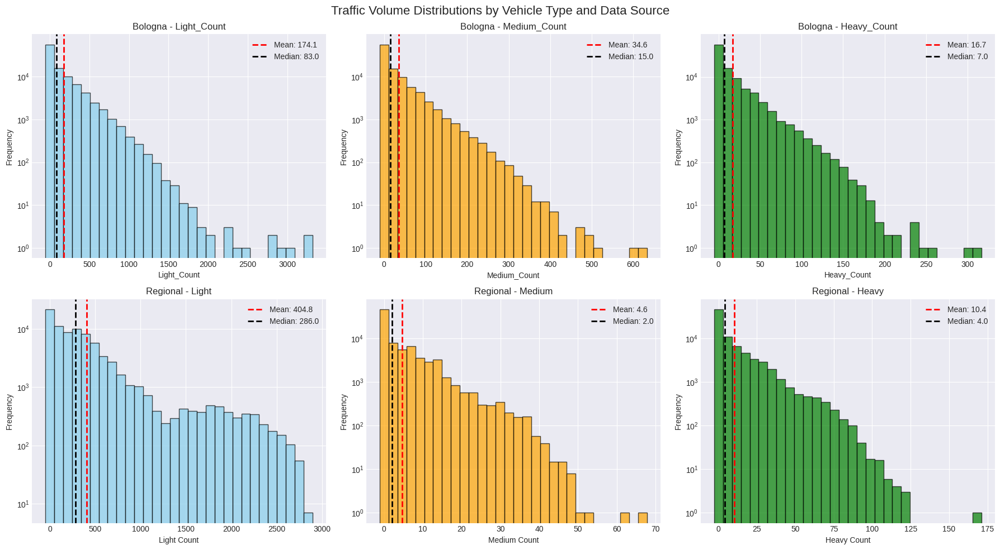

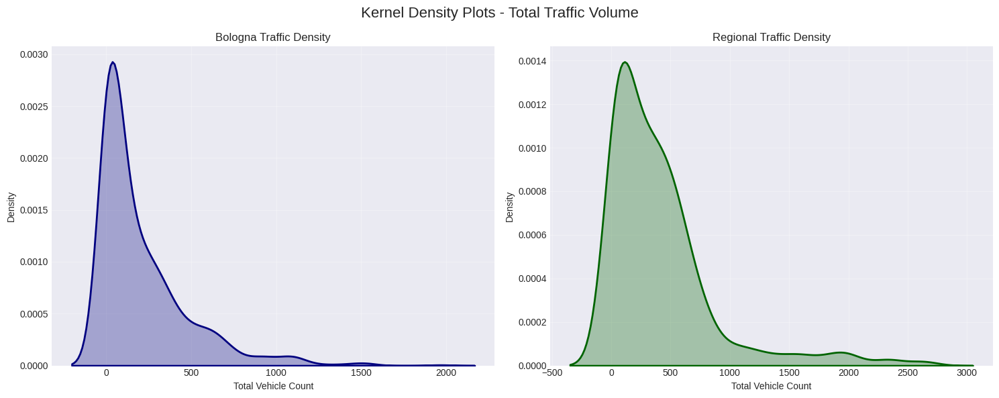

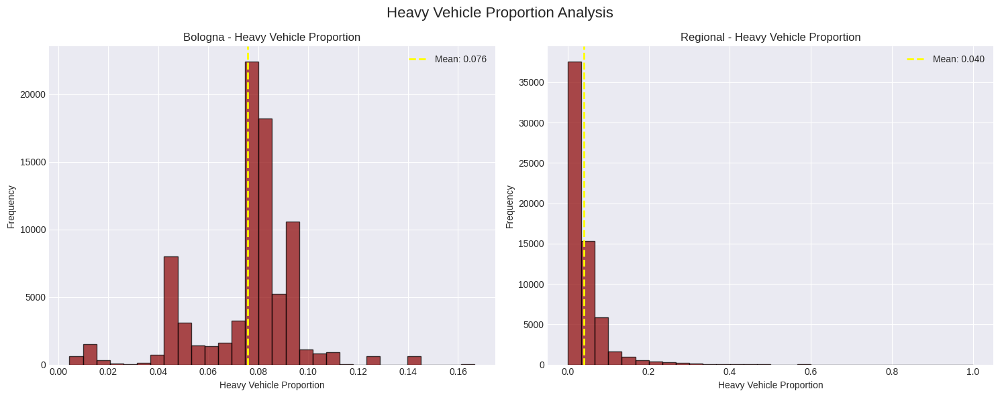


📊 Data Sampling Information:
Original Bologna data: 7,406,376 rows
Sampled Bologna data: 100,000 rows
Original Regional data: 81,290 rows
Sampled Regional data: 81,290 rows


In [11]:
explore_traffic_distributions(df_bol, df_regional, final_dataset, sample_size=100000)


In [12]:
generate_traffic_summary_statistics(df_bol, df_regional, final_dataset)

TRAFFIC DATA SUMMARY STATISTICS

1. SUMMARY BY DATA SOURCE
--------------------------------------------------

Bologna Traffic Statistics:
       Light_Count  Medium_Count  Heavy_Count
count   7406376.00    7406376.00   7406376.00
mean        174.10         34.60        16.72
std         228.23         47.96        23.49
min           0.00          0.00         0.00
25%          17.00          3.00         1.00
50%          83.00         15.00         7.00
75%         249.00         48.00        23.00
max        6621.00       1739.00       836.00

Regional Traffic Statistics:
          Light    Medium     Heavy
count  81290.00  81290.00  81290.00
mean     404.78      4.62     10.38
std      470.93      6.61     15.14
min        0.00      0.00      0.00
25%       87.00      0.00      1.00
50%      286.00      2.00      4.00
75%      507.00      7.00     14.00
max     2945.00     69.00    174.00

2. SUMMARY BY DATA SOURCE (Final Dataset)
--------------------------------------------------

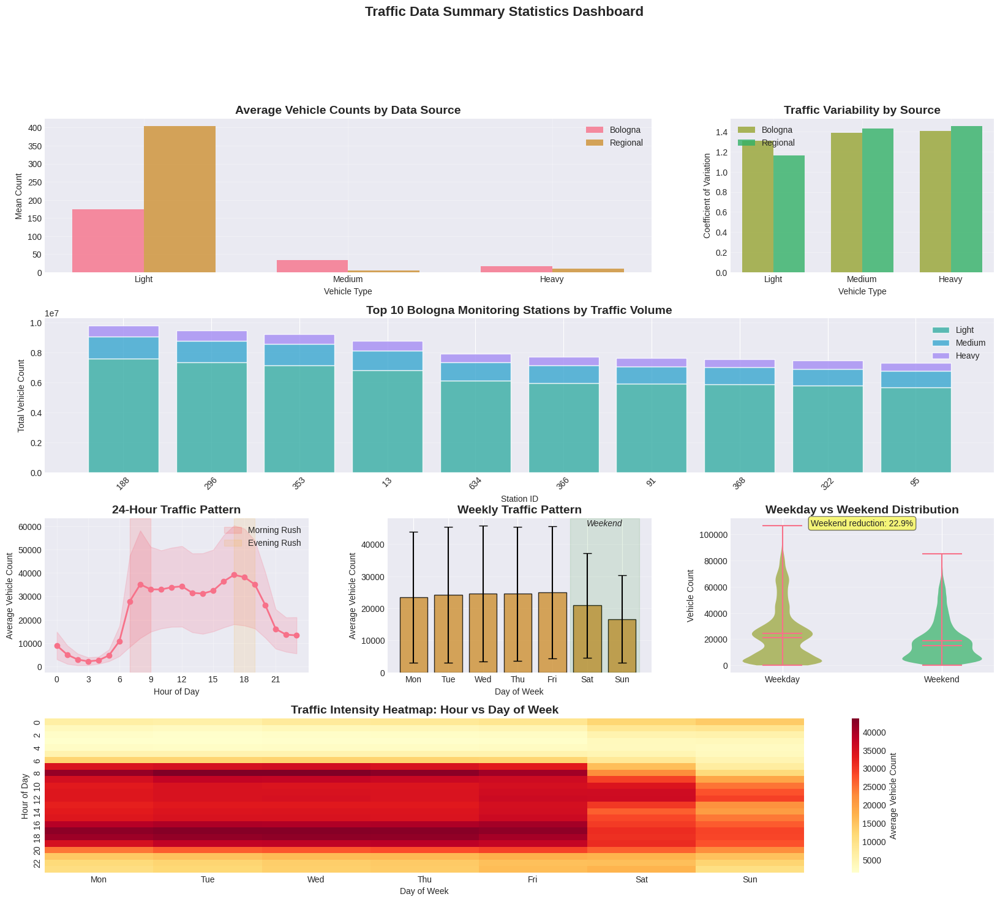

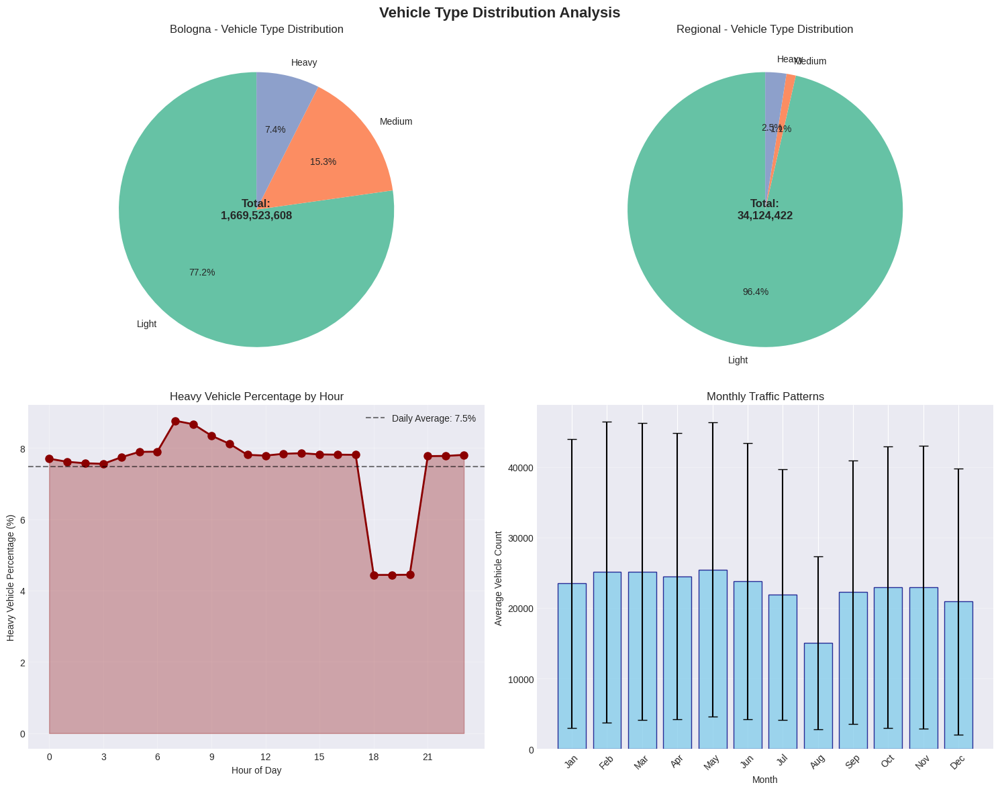


VISUAL SUMMARY STATISTICS INSIGHTS

🚦 TRAFFIC PATTERNS:
   - Peak traffic hour: 17:00 (39165 vehicles)
   - Lowest traffic hour: 3:00 (2213 vehicles)
   - Peak to low ratio: 17.7x

📅 WEEKLY PATTERNS:
   - Weekday average: 24363 vehicles/hour
   - Weekend average: 18784 vehicles/hour
   - Weekend reduction: 22.9%

🚛 VEHICLE TYPE INSIGHTS:
   - Bologna heavy vehicle ratio: 7.4%
   - Regional heavy vehicle ratio: 2.5%



In [13]:
visualize_traffic_summary_statistics(df_bol, df_regional, final_dataset)

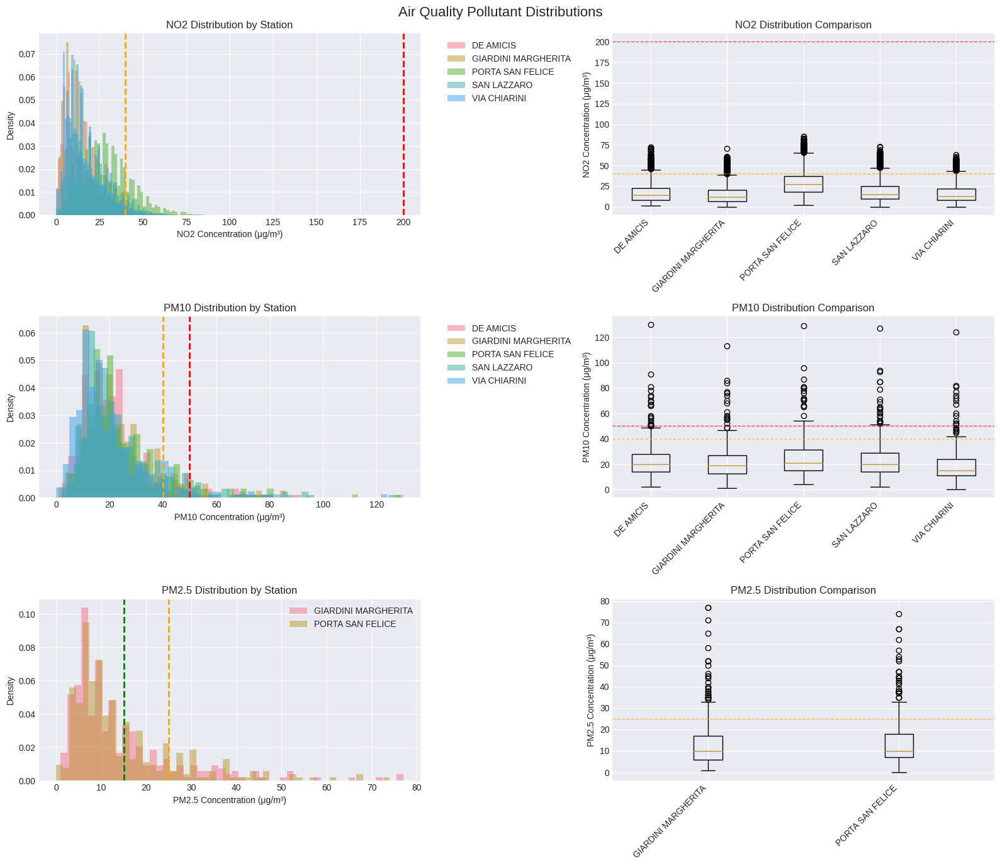

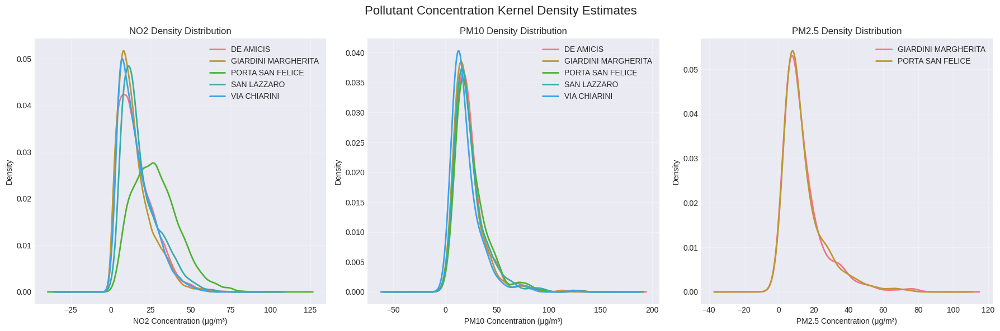

In [13]:
explore_air_quality_distributions(df_no2, df_pm10, df_pm25, stations_df)

In [23]:
df_no2.dtypes, df_pm10.dtypes, df_pm25.dtypes

(data                     datetime64[ns]
 DE AMICIS                       float64
 v_DE AMICIS                      object
 GIARDINI MARGHERITA             float64
 v_GIARDINI MARGHERITA            object
 PORTA SAN FELICE                float64
 v_PORTA SAN FELICE               object
 SAN LAZZARO                     float64
 v_SAN LAZZARO                    object
 VIA CHIARINI                    float64
 v_VIA CHIARINI                   object
 datetime                 datetime64[ns]
 hour                              int32
 dtype: object,
 data                     datetime64[ns]
 DE AMICIS                       float64
 v_DE AMICIS                      object
 GIARDINI MARGHERITA             float64
 v_GIARDINI MARGHERITA            object
 PORTA SAN FELICE                float64
 v_PORTA SAN FELICE               object
 SAN LAZZARO                     float64
 v_SAN LAZZARO                    object
 VIA CHIARINI                    float64
 v_VIA CHIARINI                   object


In [ ]:
analyze_air_quality_standards_compliance(df_no2, df_pm10, df_pm25)
    

AIR QUALITY STANDARDS COMPLIANCE ANALYSIS

1. NO2 COMPLIANCE ANALYSIS
--------------------------------------------------

DE AMICIS:
  - Annual Average: 16.23 μg/m³ (EU Limit: 40 μg/m³)
  - Status: ✓ COMPLIANT
  - Hourly Exceedances: 0 times (0.00% of measurements)
  - Max Hourly: 72.00 μg/m³

GIARDINI MARGHERITA:
  - Annual Average: 14.71 μg/m³ (EU Limit: 40 μg/m³)
  - Status: ✓ COMPLIANT
  - Hourly Exceedances: 0 times (0.00% of measurements)
  - Max Hourly: 71.00 μg/m³

PORTA SAN FELICE:
  - Annual Average: 28.37 μg/m³ (EU Limit: 40 μg/m³)
  - Status: ✓ COMPLIANT
  - Hourly Exceedances: 0 times (0.00% of measurements)
  - Max Hourly: 85.00 μg/m³

SAN LAZZARO:
  - Annual Average: 18.52 μg/m³ (EU Limit: 40 μg/m³)
  - Status: ✓ COMPLIANT
  - Hourly Exceedances: 0 times (0.00% of measurements)
  - Max Hourly: 73.00 μg/m³

VIA CHIARINI:
  - Annual Average: 15.68 μg/m³ (EU Limit: 40 μg/m³)
  - Status: ✓ COMPLIANT
  - Hourly Exceedances: 0 times (0.00% of measurements)
  - Max Hourly: 63.0

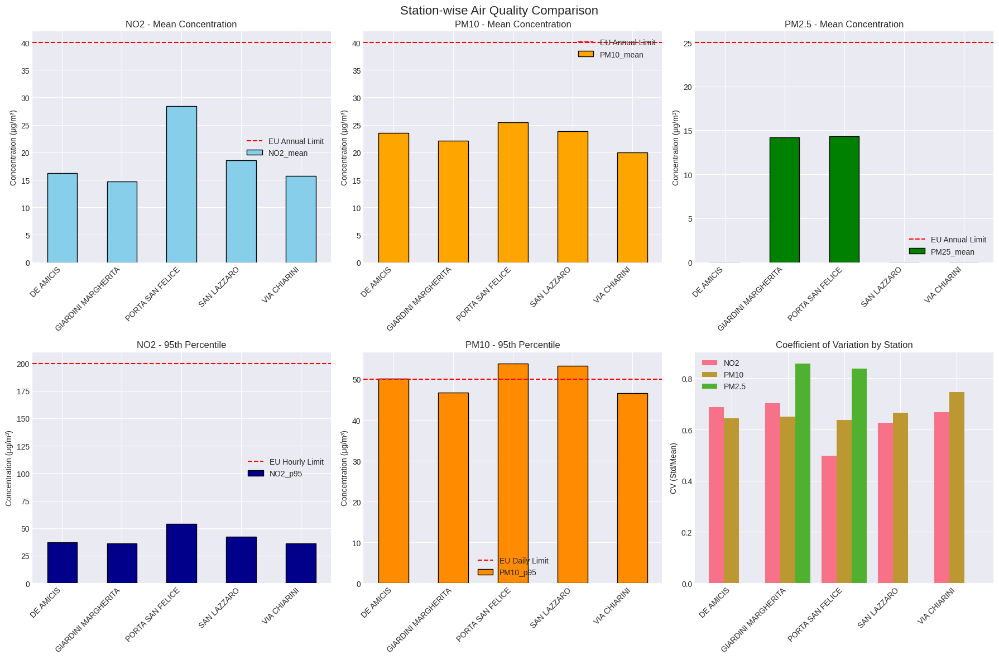


STATION-WISE POLLUTANT STATISTICS SUMMARY
                     NO2_mean  NO2_median  NO2_std  NO2_p95  NO2_max  \
DE AMICIS               16.23        14.0    11.14     37.0     72.0   
GIARDINI MARGHERITA     14.71        12.0    10.33     36.0     71.0   
PORTA SAN FELICE        28.37        27.0    14.12     54.0     85.0   
SAN LAZZARO             18.52        15.0    11.62     42.0     73.0   
VIA CHIARINI            15.68        13.0    10.48     36.0     63.0   

                     PM10_mean  PM10_median  PM10_std  PM10_p95  PM10_max  \
DE AMICIS                23.57         20.0     15.19     50.10     130.0   
GIARDINI MARGHERITA      22.16         19.0     14.42     46.65     113.0   
PORTA SAN FELICE         25.46         21.0     16.22     53.90     129.0   
SAN LAZZARO              23.88         20.0     15.91     53.30     127.0   
VIA CHIARINI             19.97         15.0     14.91     46.60     124.0   

                     PM25_mean  PM25_median  PM25_std  PM25_p

In [14]:

# Station comparisons
create_station_comparison_plot(df_no2, df_pm10, df_pm25, stations_df)


## Temporal Pattern Analysis

### Time series Visualization


📊 Creating hourly pattern visualizations...


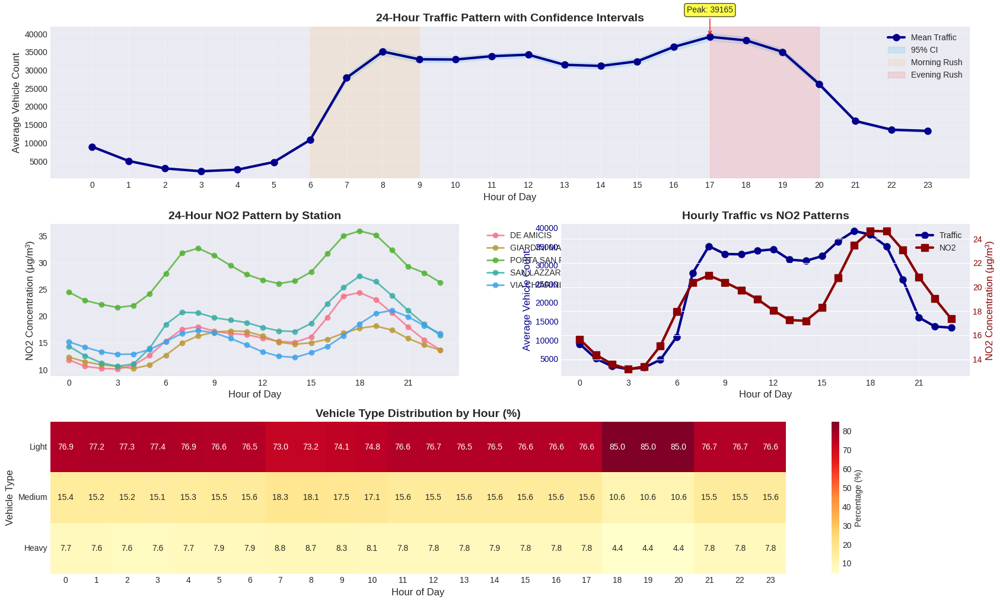

In [17]:
print("\n📊 Creating hourly pattern visualizations...")
visualize_hourly_patterns(final_dataset, df_no2)


📅 Creating weekly pattern visualizations...


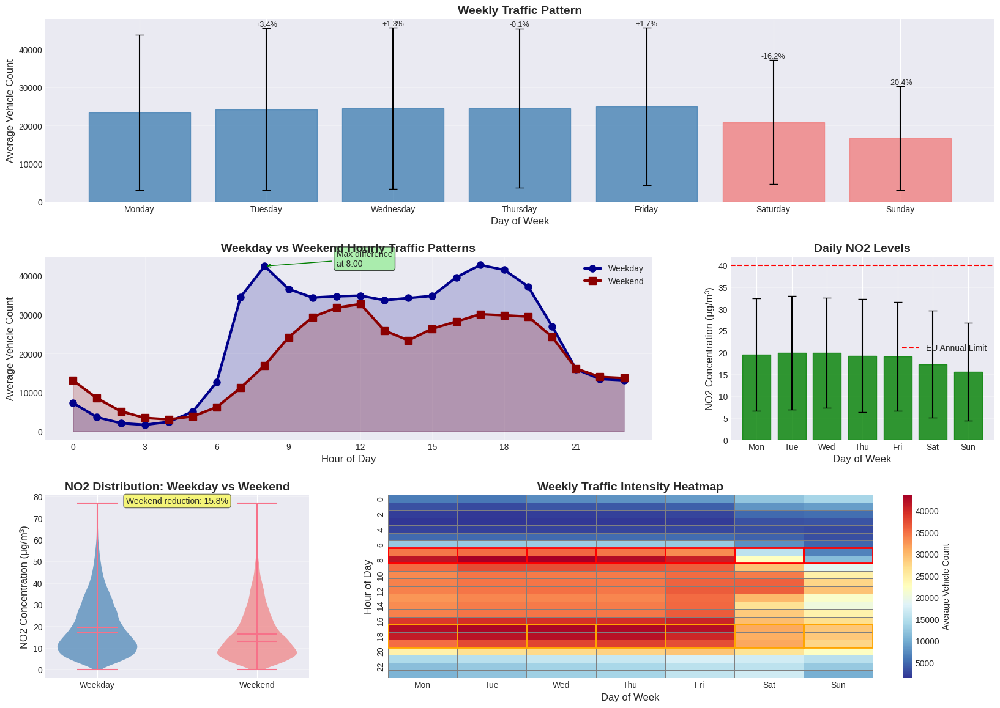

In [18]:
print("\n📅 Creating weekly pattern visualizations...")
visualize_weekly_patterns(final_dataset, df_no2, df_pm10)


📉 Creating advanced time series visualizations...


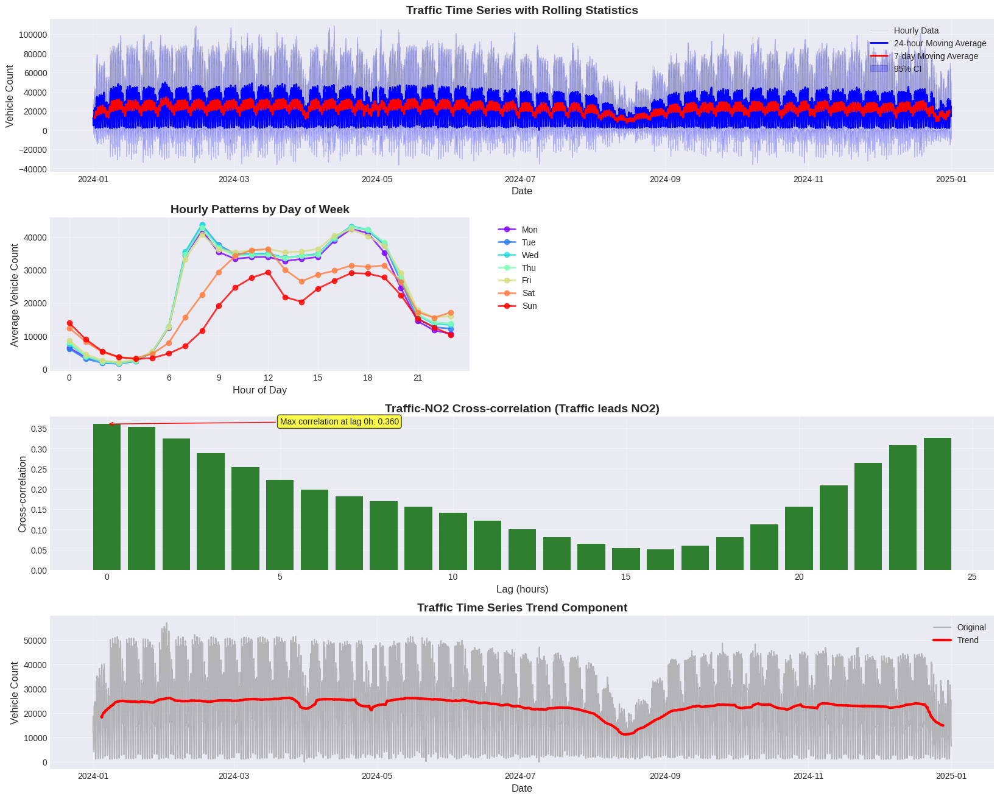

In [19]:

# 4. Advanced time series plots
print("\n📉 Creating advanced time series visualizations...")
create_advanced_timeseries_plots(final_dataset)


### Rush Hour Analysis

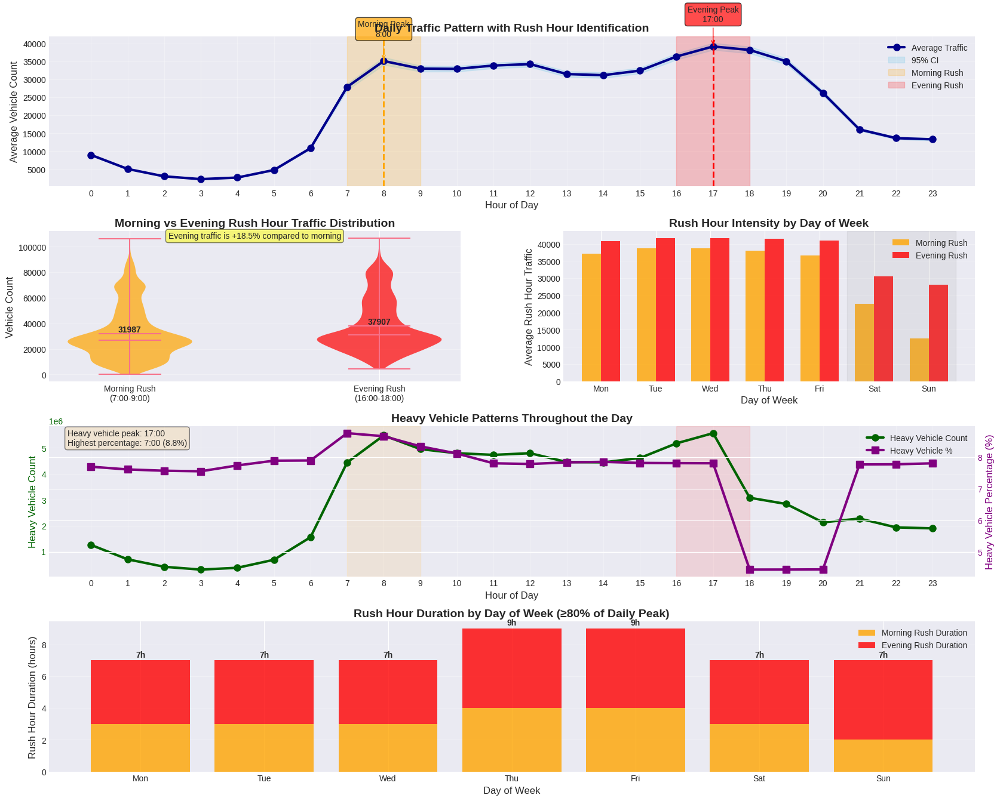

In [20]:
visualize_rush_hour_patterns(final_dataset)

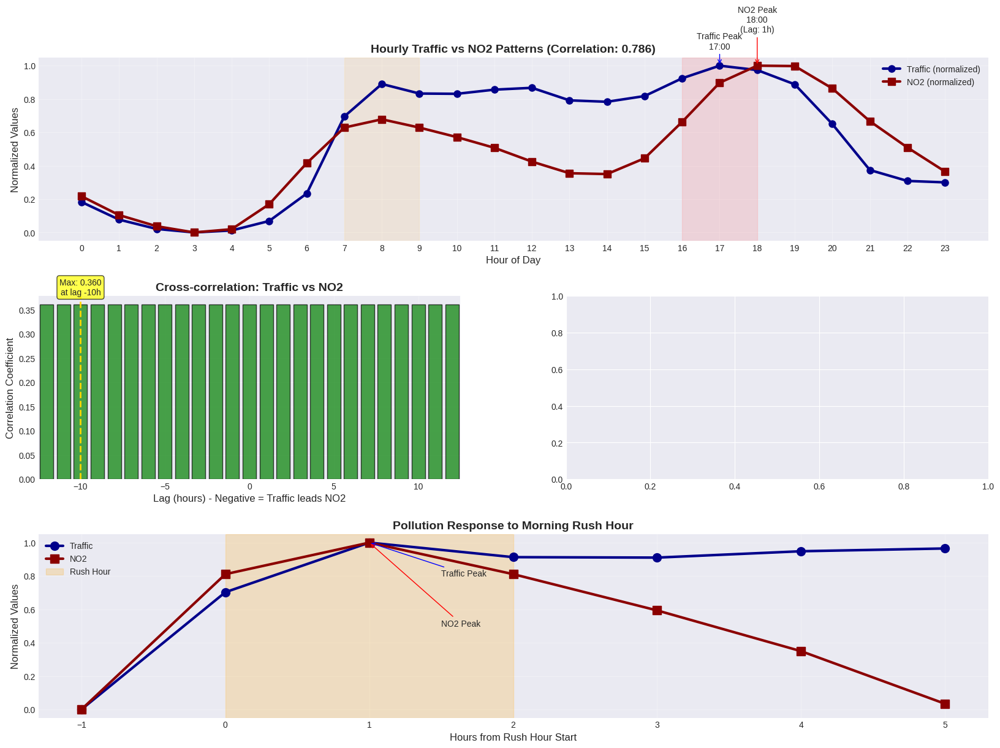

In [21]:
analyze_traffic_pollution_correlation(final_dataset)

In [44]:
generate_rush_hour_summary(final_dataset)


RUSH HOUR ANALYSIS SUMMARY

📍 RUSH HOUR IDENTIFICATION:
   Morning Rush: 7:00 - 9:00
   Morning Peak: 8:00
   Evening Rush: 16:00 - 18:00
   Evening Peak: 17:00

🚗 TRAFFIC STATISTICS:
   Rush Hour Average: 34734 vehicles/hour
   Non-Rush Average: 18790 vehicles/hour
   Rush Hour Increase: 84.9%

🌫️ POLLUTION IMPACT:
   NO2:
      Rush Hour: 22.4 μg/m³
      Non-Rush: 17.4 μg/m³
      Increase: 28.6%



### Seasonality Analysis


📊 Performing traffic STL decomposition...


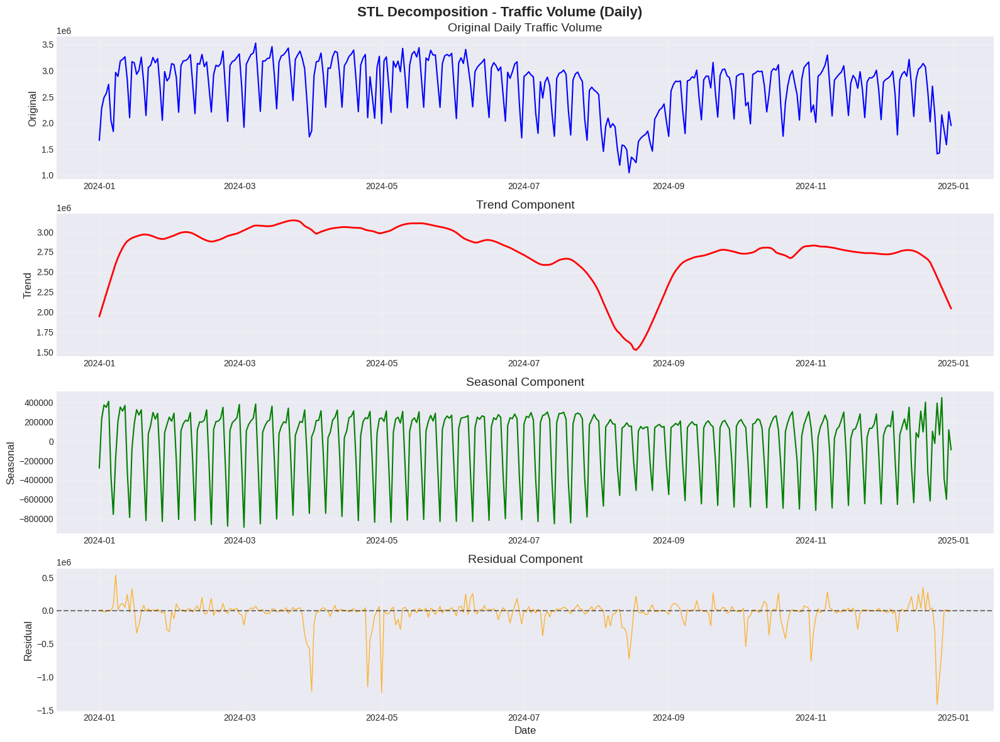

In [49]:
# 1. Traffic STL decomposition
print("\n📊 Performing traffic STL decomposition...")
traffic_decomp_daily = perform_traffic_stl_decomposition(final_dataset, period='daily')



🌫️ Performing air quality STL decomposition...


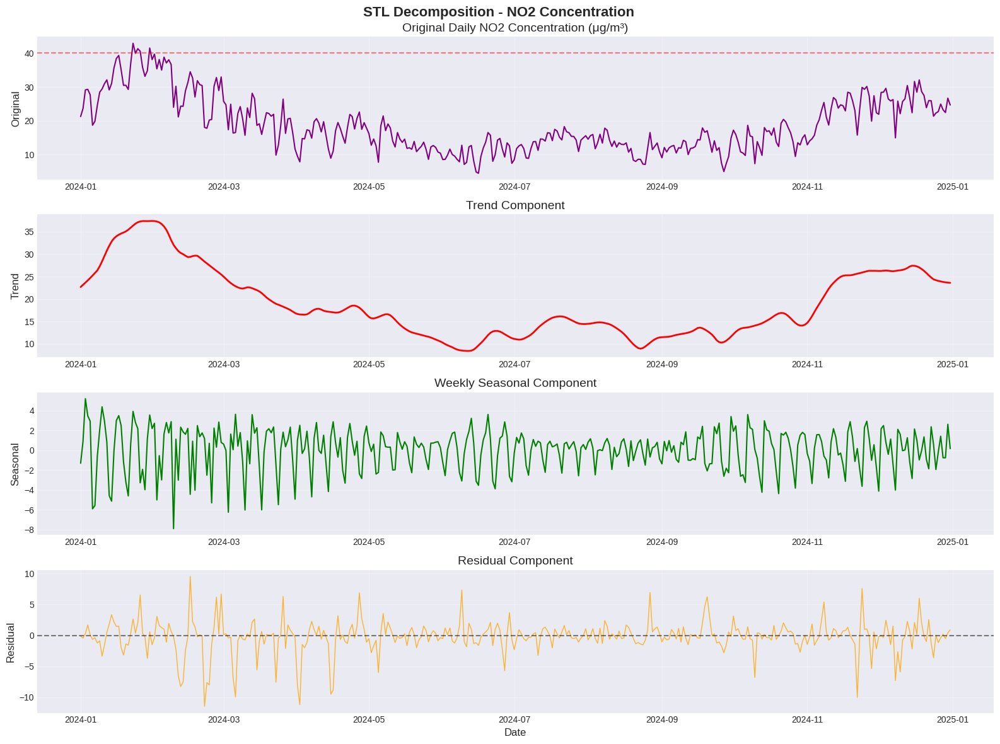

In [51]:

# 2. Air quality STL decomposition
print("\n🌫️ Performing air quality STL decomposition...")
no2_decomp = perform_airquality_stl_decomposition(final_dataset, 'NO2')



📈 Analyzing multi-scale patterns...


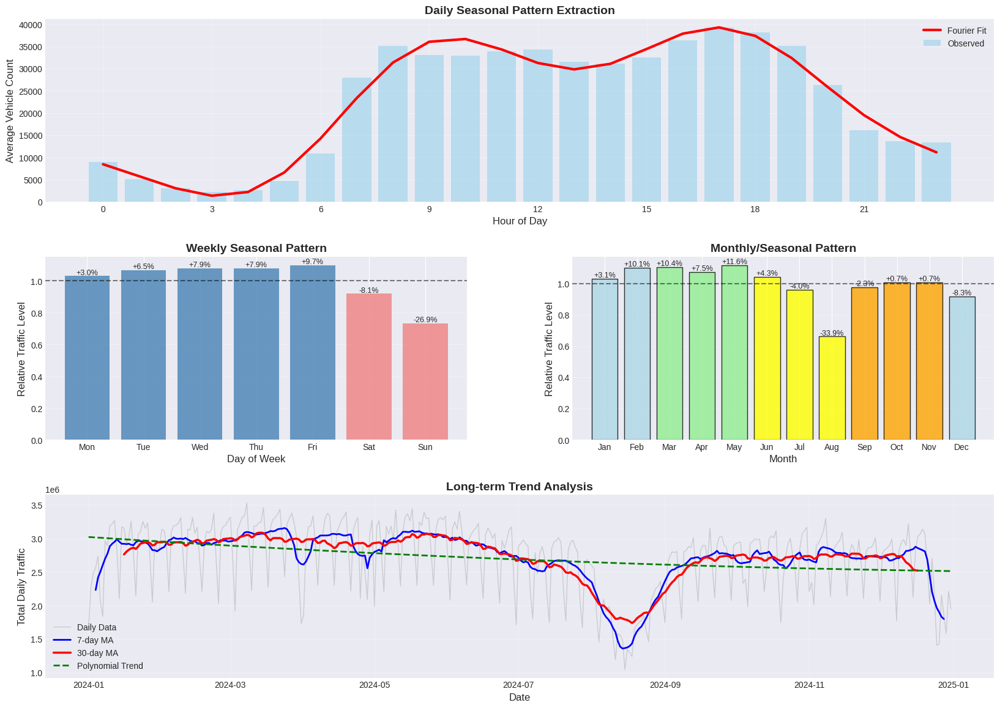

In [54]:
# 3. Multi-scale decomposition
print("\n📈 Analyzing multi-scale patterns...")
perform_multiscale_decomposition(final_dataset)


📉 Analyzing detrended and deseasonalized patterns...


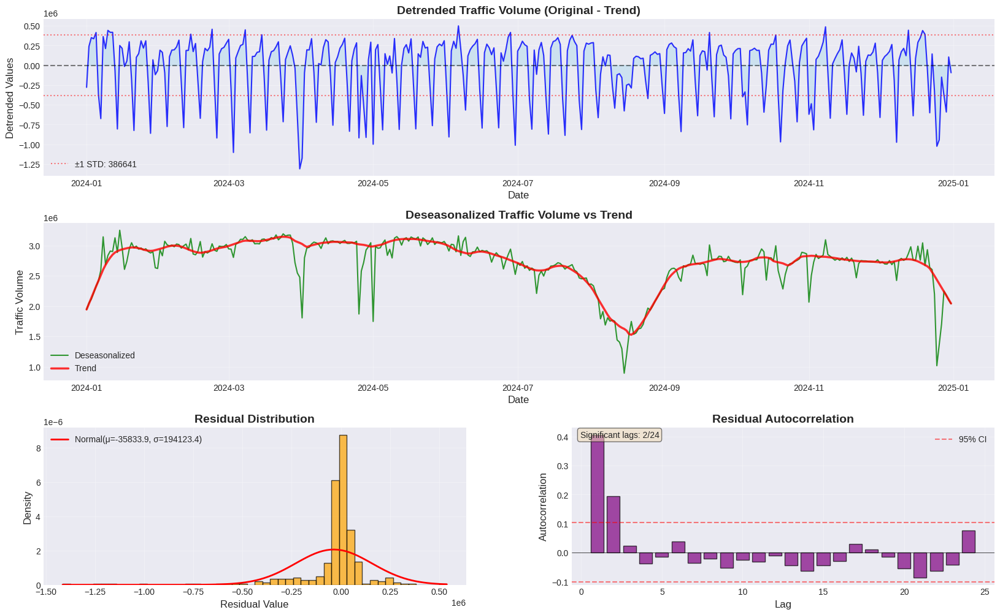

In [68]:

# 4. Analyze detrended/deseasonalized data
if traffic_decomp_daily:
    print("\n📉 Analyzing detrended and deseasonalized patterns...")
    analyze_detrended_deseasonalized_data(final_dataset, traffic_decomp_daily)


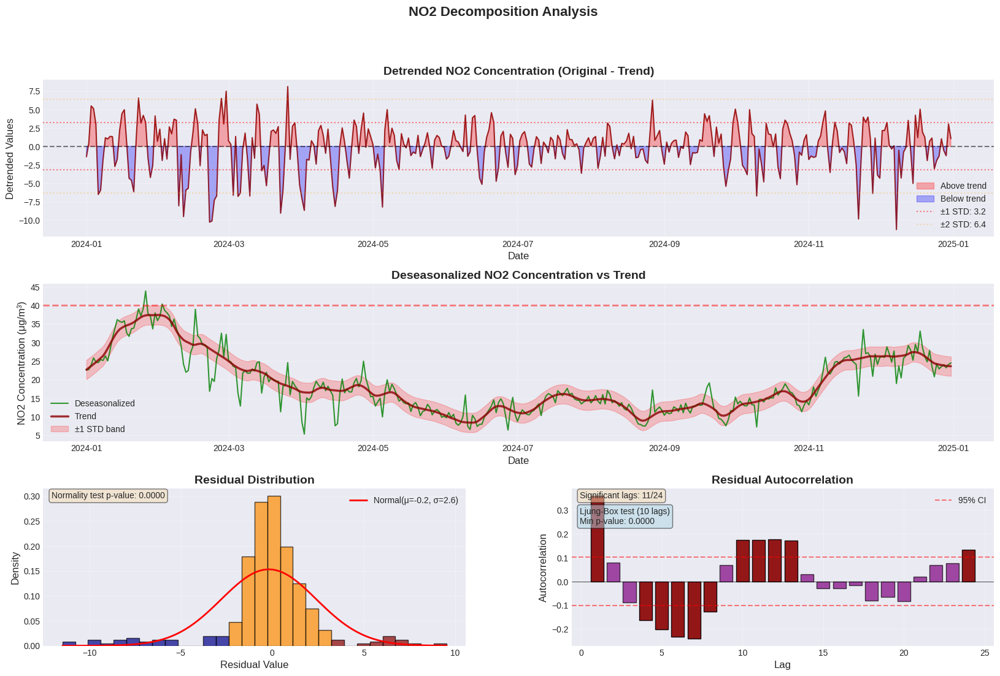

In [74]:
decomp_no2 = analyze_detrended_deseasonalized_airquality(final_dataset, 'NO2')



🔍 Comparing traffic and pollution decompositions...


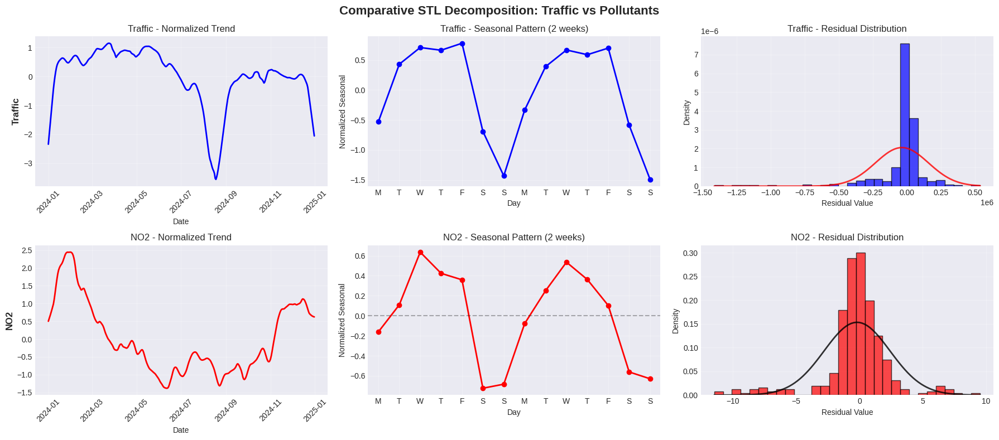


DECOMPOSITION SUMMARY

traffic:
  Trend Strength: 0.772
  Seasonal Strength: 0.748
  Residual Std Dev: 194123.430

NO2:
  Trend Strength: 0.892
  Seasonal Strength: 0.331
  Residual Std Dev: 2.603
  Trend correlation with traffic: 0.246


{'traffic': <statsmodels.tsa.seasonal.DecomposeResult at 0x77d37b86d590>,
 'NO2': <statsmodels.tsa.seasonal.DecomposeResult at 0x77d3e8b583d0>}

In [69]:
# 6. Comparative analysis
print("\n🔍 Comparing traffic and pollution decompositions...")
compare_traffic_pollution_decomposition(final_dataset)

# Geospatial Analysis

## Traffic Heatmap

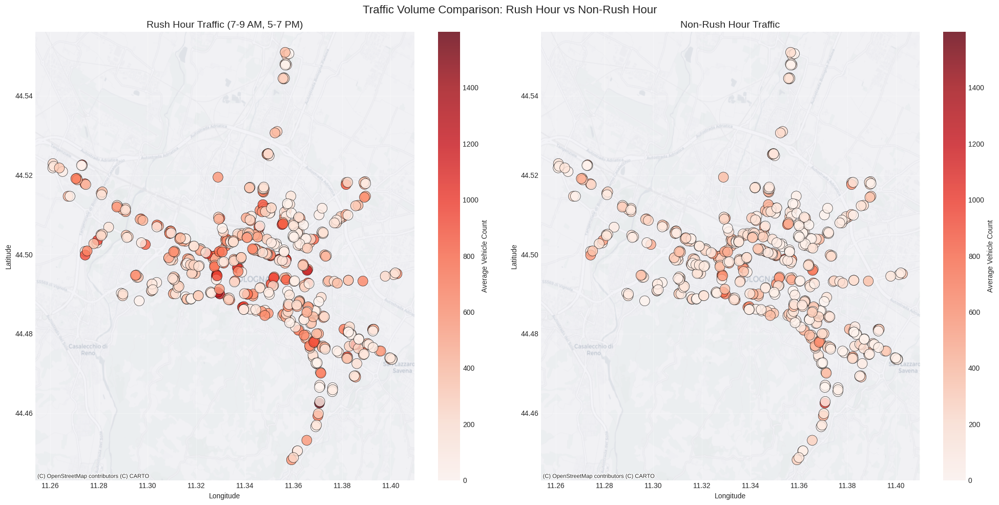

In [67]:
fig = create_peak_hour_comparison(df_bol, bologna_metadata)

Heatmap saved as: ../pictures/analysis_results/traffic_heatmap.png


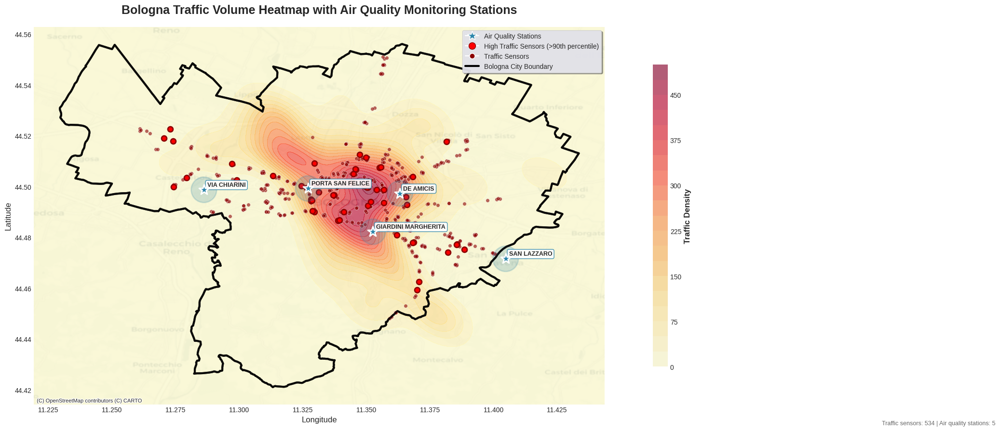

In [16]:

# Create PNG heatmap
fig, ax = create_traffic_heatmap_png(df_bol, bologna_metadata, stations_df, 
                                    bologna_boundary, save_path='../pictures/analysis_results/traffic_heatmap.png', figsize=(50, 9))


In [32]:
create_traffic_heatmap(df_bol, bologna_metadata)

In [30]:
create_animated_traffic_heatmap(df_bol, bologna_metadata)

(<Figure size 1400x1200 with 2 Axes>,
 <Axes: title={'center': 'Traffic Density Hexbin Heatmap - Bologna'}, xlabel='Longitude', ylabel='Latitude'>)

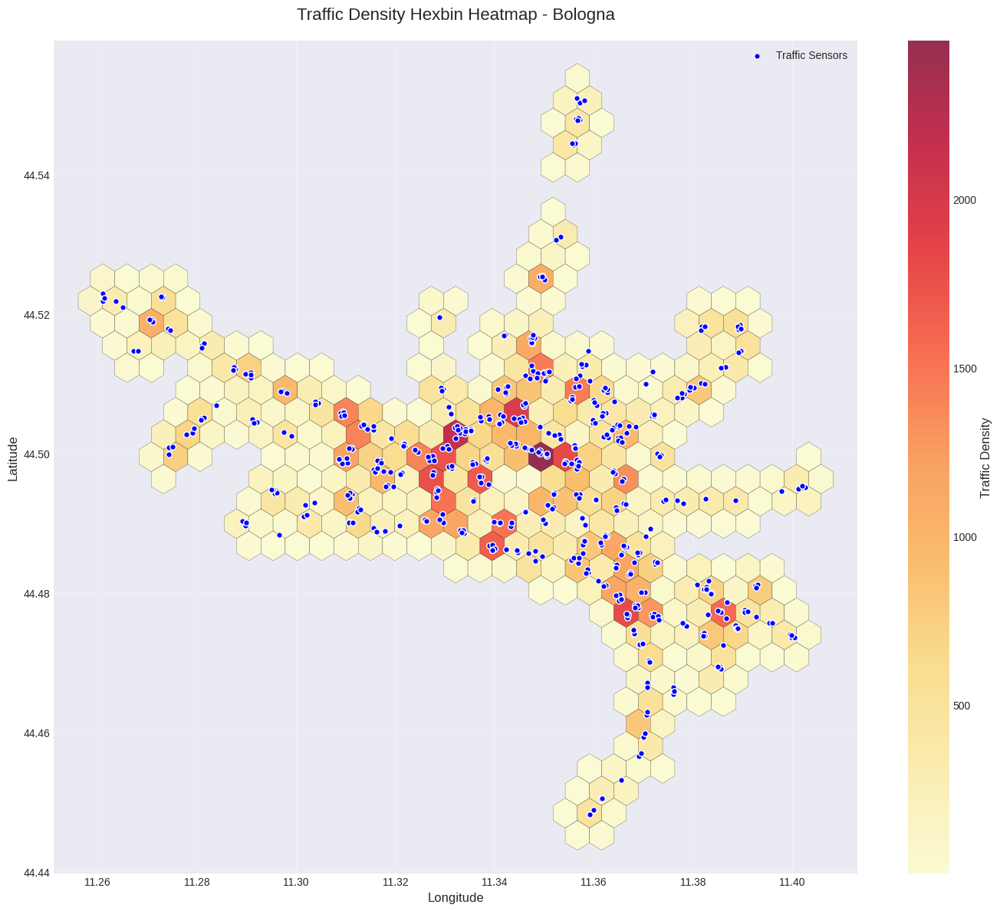

In [49]:
create_hexbin_heatmap(df_bol, bologna_metadata)


In [ ]:
create_base_map_with_stations(bologna_metadata, regional_metadata, stations_df, buffer_zones, bologna_boundary)

## Traffic Flow Map

In [63]:
create_simple_traffic_flow_map(df_bol.head(5000), bol_gdf, bologna_metadata)

## Zone Based Analysis

In [13]:
zone_analysis, zones_map, interactive_map = analyze_traffic_by_zones(
    df_bol.head(10000), bol_gdf, bologna_metadata, bol_zones, stations_df, df_no2
);

1. Assigning traffic sensors to zones...

2. Aggregating traffic data by zone...
Zone traffic columns: ['zone_name', 'zone_code', 'total_vehicles_sum', 'total_vehicles_mean', 'total_vehicles_std', 'Heavy_Count_sum', 'Heavy_Count_mean', 'Light_Count_sum', 'Light_Count_mean', 'Medium_Count_sum', 'Medium_Count_mean', 'sensor_count']

3. Calculating traffic density and patterns...
        zone_name zone_code  total_vehicles_sum  total_vehicles_mean  \
0           Barca         A                7980            47.500000   
1       Bolognina         B               45307           101.131696   
2  Borgo Panigale         C               35015            84.577295   
3           Colli         D                7649            96.822785   
4      Corticella         E                9287            56.284848   

   total_vehicles_std  Heavy_Count_sum  Heavy_Count_mean  Light_Count_sum  \
0           44.164499              608          3.619048             6149   
1          123.746577            

In [126]:
interactive_map

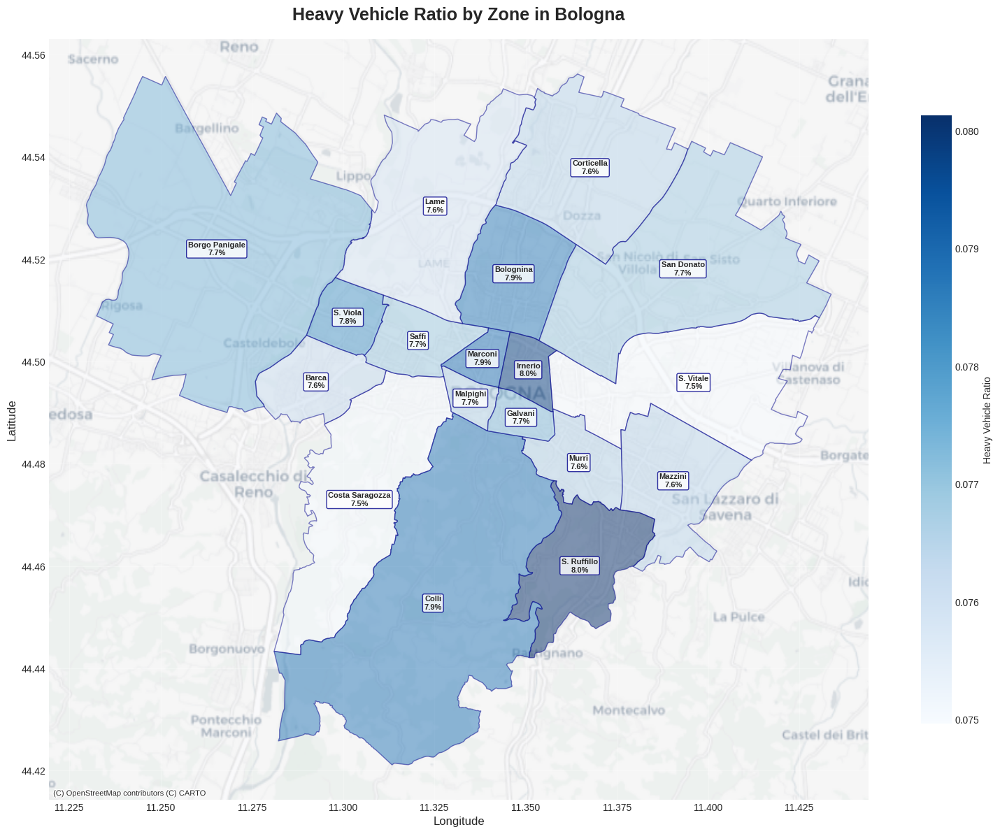

(<Figure size 1600x1200 with 2 Axes>,
 <Axes: title={'center': 'Heavy Vehicle Ratio by Zone in Bologna'}, xlabel='Longitude', ylabel='Latitude'>)

In [ ]:
plot_heavy_vehicle_ratio(zones_map, save_path='../pictures/analysis_results/heavy_vehicle_ratio_zones_simple.png')

In [ ]:
# Basic traffic density visualization 

zones_map.explore(
    column='traffic_density',
    tooltip=['zone_name',
            'total_vehicles_sum',
            'Heavy_Count_sum',
            'Light_Count_sum',
            'Medium_Count_sum',
            'sensor_count',
            'traffic_density',
            'heavy_vehicle_ratio'],
    popup=True,
    tiles='CartoDB positron',
    cmap='YlOrRd',
    style_kwds=dict(color="black", weight=2),
    legend_kwds=dict(caption='Traffic Density', colorbar=True),
    name="Traffic Density",
)

In [ ]:
# Total Vehicles Mean
m4 = zones_map.explore(
    column='total_vehicles_mean',
    tooltip=['zone_name', 'total_vehicles_mean', 'total_vehicles_sum', 'heavy_vehicle_ratio','area_y'],
        popup=True,
    tiles='OpenStreetMap',
    cmap='viridis',
    style_kwds={
        'color': 'black',
        'weight': 2,
        'fillOpacity': 0.8
    },
    legend_kwds={
        'caption': 'Average Vehicle Count',
        'colorbar': True,
        'fmt': '{:.0f}',
        'max_labels': 8
    }
)

m4


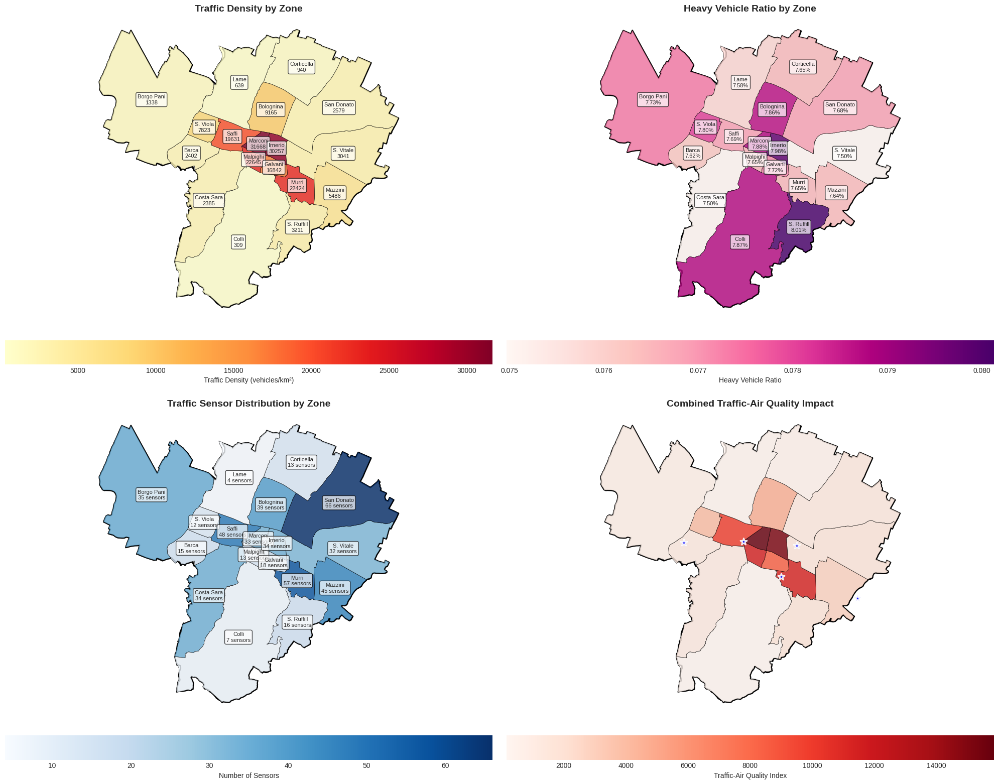

In [129]:
fig1 = create_zone_comparison_maps(zone_analysis, bol_zones, bologna_boundary, stations_df)
plt.show()

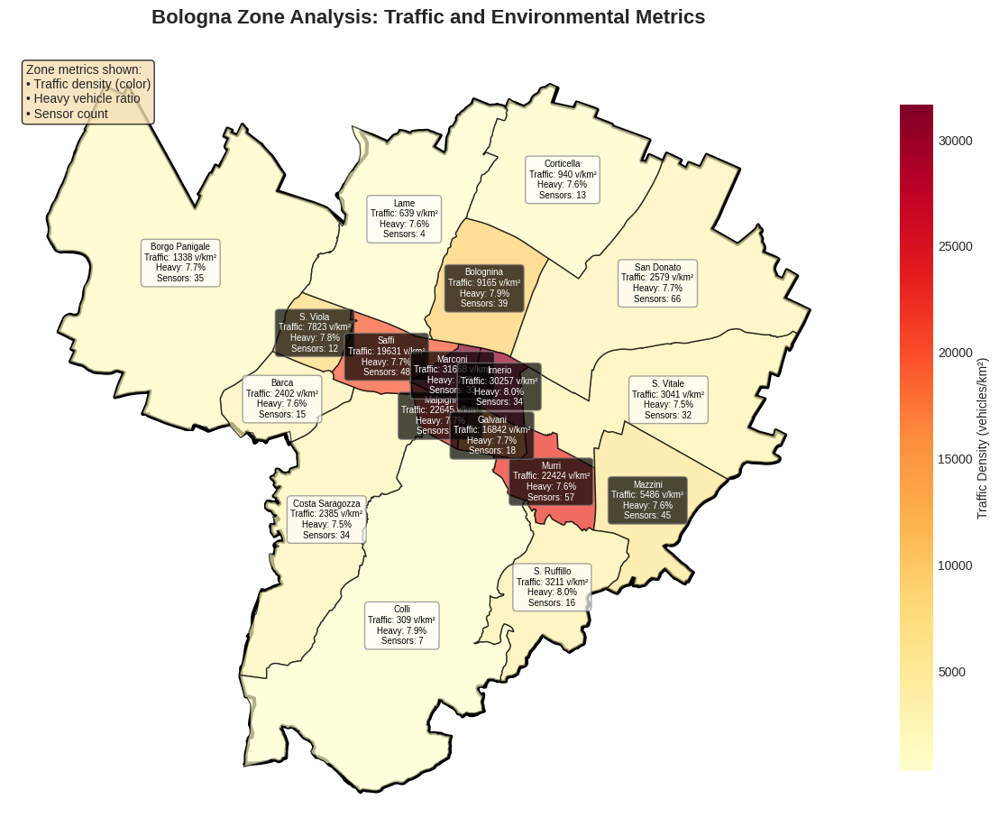

In [14]:
fig2 = create_interactive_zone_map(zone_analysis, bol_zones, bologna_boundary)
plt.show()

In [131]:
print("\nZone Analysis Summary:")
print(zone_analysis[['zone_name', 'traffic_density', 'heavy_vehicle_ratio' ,'NO2_mean']].sort_values('traffic_density', ascending=False))


Zone Analysis Summary:
          zone_name  traffic_density  heavy_vehicle_ratio   NO2_mean
10          Marconi     31668.055940             0.078773  28.369368
7           Irnerio     30256.605185             0.079817        NaN
9          Malpighi     22644.853131             0.076530        NaN
12            Murri     22424.063127             0.076487  14.705027
16            Saffi     19631.040284             0.076880        NaN
6           Galvani     16842.001432             0.077197        NaN
1         Bolognina      9164.858951             0.078641        NaN
14         S. Viola      7823.197808             0.078049        NaN
11          Mazzini      5486.160279             0.076403        NaN
13      S. Ruffillo      3211.150323             0.080131        NaN
15        S. Vitale      3041.026314             0.074966  16.227210
17       San Donato      2579.383917             0.076838        NaN
0             Barca      2402.231397             0.076190  15.678694
5   Costa 

## Spatial Analysis

In [106]:
visualizer = TrafficAirQualityVisualizer(
        final_dataset=final_dataset,
        buffer_zones=buffer_zones,
        traffic_with_zones=traffic_with_zones,
        zone_summary=zone_summary,
        stations_df=stations_df
    )

In [107]:
# Create traffic density heatmap
traffic_map = visualizer.create_traffic_density_heatmap(bologna_gpd=bologna_boundary)
traffic_map.save('../data/maps/traffic_density_heatmap.html')
traffic_map

Creating weighted impact visualization...


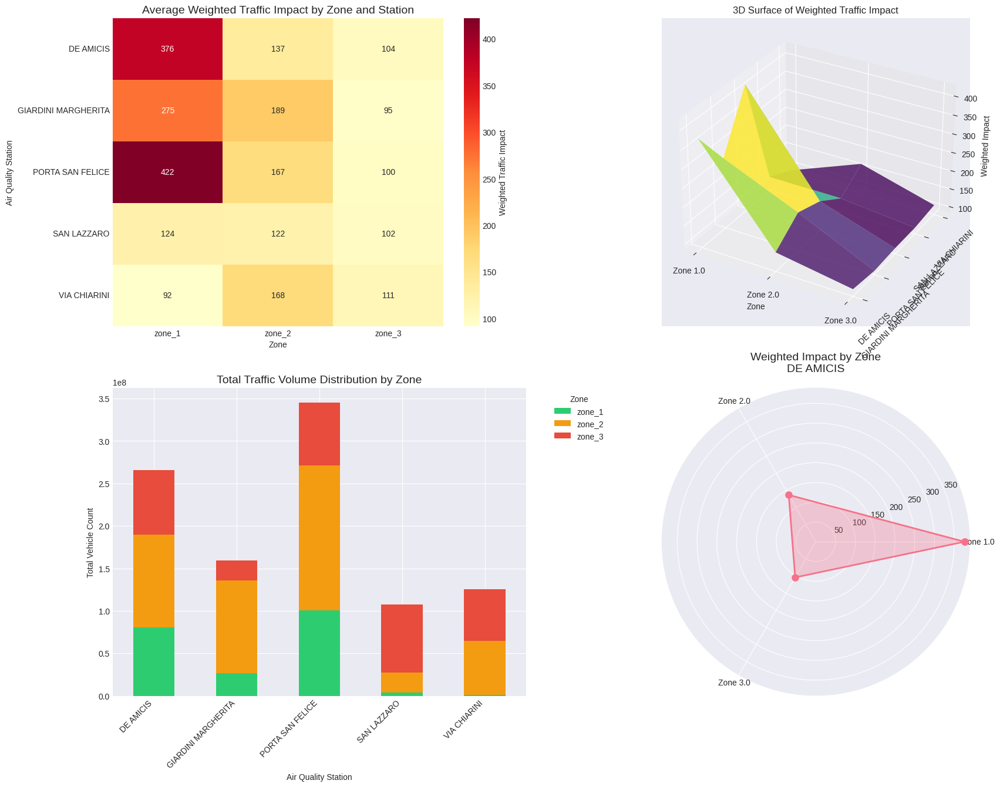

In [ ]:
print("Creating weighted impact visualization...")
impact_fig = visualizer.create_weighted_impact_by_zone()
plt.savefig('weighted_impact_by_zone.png', dpi=300, bbox_inches='tight')
plt.show()

Creating zone comparison dashboard...


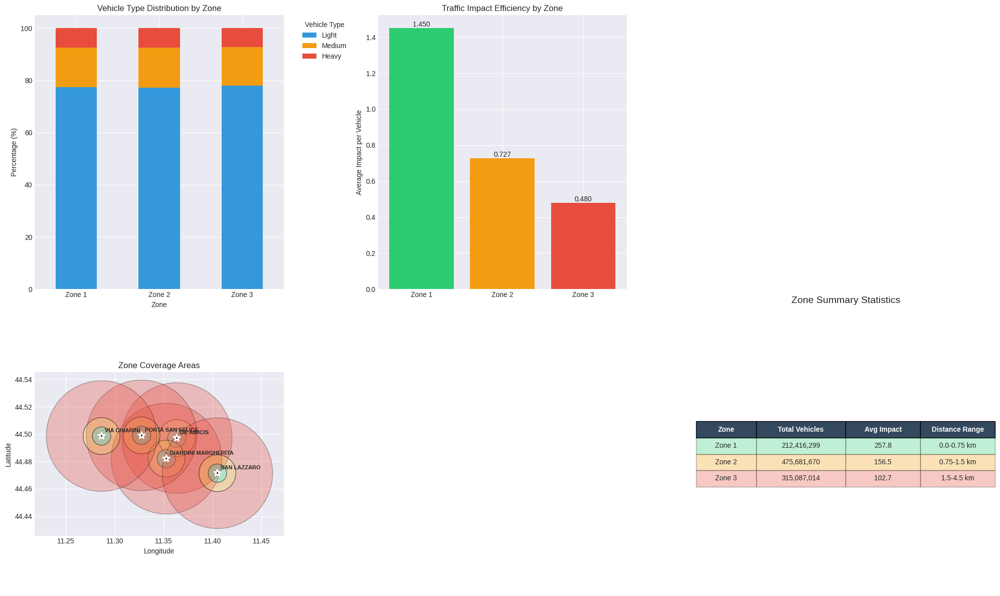

In [11]:

print("Creating zone comparison dashboard...")
comparison_fig = visualizer.create_zone_comparison_dashboard()
plt.savefig('zone_comparison_dashboard.png', dpi=300, bbox_inches='tight')
plt.show()

# Bivariate and Correlation Analysis


Creating correlation heatmaps...


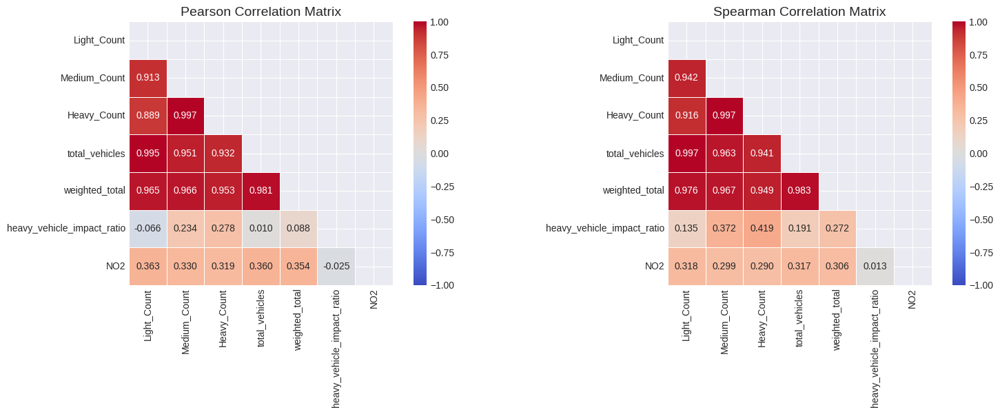

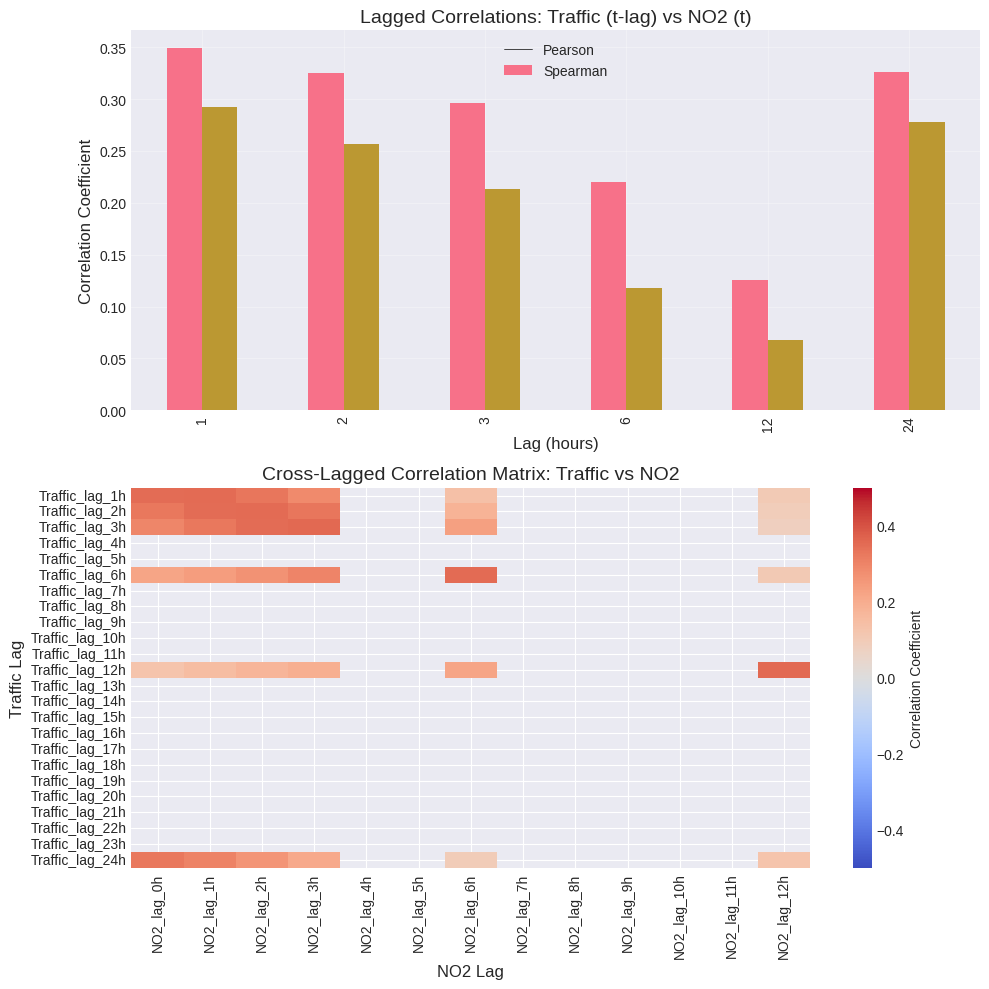


Analyzing vehicle type impacts...


posx and posy should be finite values
posx and posy should be finite values


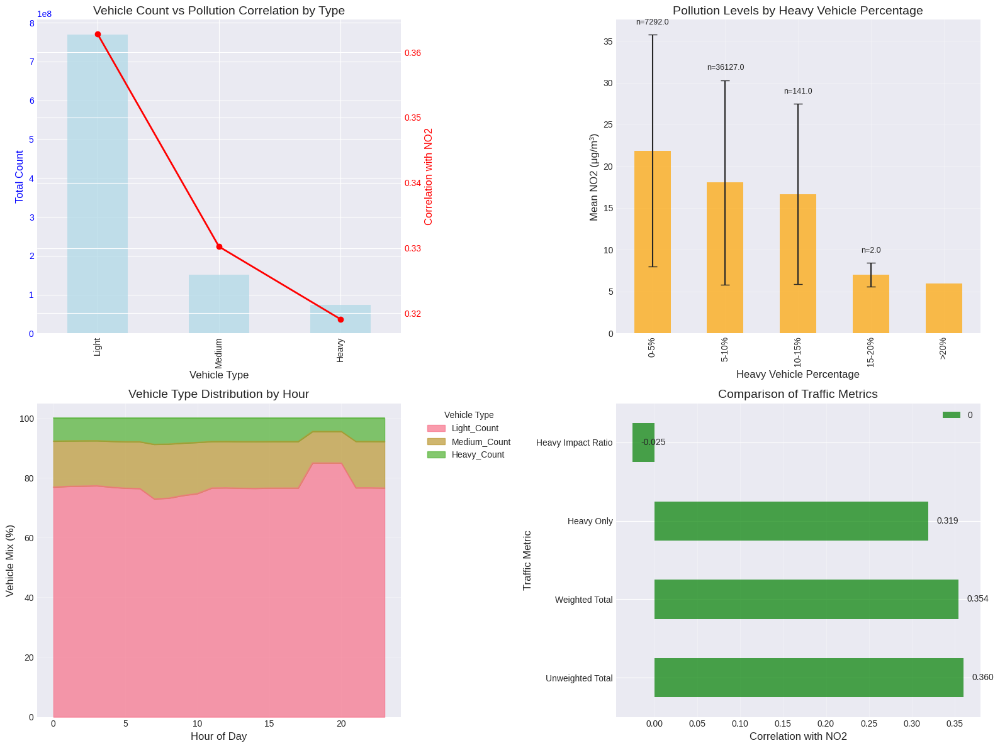


Generating statistical summary...

STATISTICAL SUMMARY: Traffic Variables vs NO2
                            Pearson_r  Pearson_p  Spearman_r  Spearman_p  \
Light_Count                    0.3628        0.0      0.3184      0.0000   
Medium_Count                   0.3302        0.0      0.2995      0.0000   
Heavy_Count                    0.3191        0.0      0.2901      0.0000   
total_vehicles                 0.3604        0.0      0.3173      0.0000   
weighted_total                 0.3543        0.0      0.3063      0.0000   
heavy_vehicle_impact_ratio    -0.0254        0.0      0.0132      0.0059   

                                R²     RMSE  
Light_Count                 0.1316  11.7491  
Medium_Count                0.1090  11.9009  
Heavy_Count                 0.1018  11.9491  
total_vehicles              0.1299  11.7611  
weighted_total              0.1256  11.7901  
heavy_vehicle_impact_ratio  0.0006  12.6041  

--------------------------------------------------
STRONGEST P

In [191]:
results = analyze_traffic_air_quality_relationships(final_dataset)

# ML Prediction

In [ ]:
# prepare the dataset
df_prepared = prepare_features_efficient(final_dataset)

EFFICIENT TIME SERIES MODELING FOR NO2 PREDICTION

Dataset size: 43574 samples
Features: 18
Train size: 34859, Test size: 8715

----------------------------------------
Training Random Forest...
Random Forest - Train R²: 0.816, Test R²: -0.427
Test MAE: 9.43, Test RMSE: 12.09

----------------------------------------
Training Decision Tree...
Decision Tree - Train R²: 0.589, Test R²: -0.868
Test MAE: 10.93, Test RMSE: 13.84

----------------------------------------
Ridge Regression - Test R²: -0.165, MAE: 8.41, RMSE: 10.93

----------------------------------------
Top 10 Most Important Features:
                   feature  importance
               Light_Count    0.183206
heavy_vehicle_impact_ratio    0.119848
            weighted_total    0.090293
            traffic_ma_24h    0.088114
             traffic_ma_6h    0.056237
            traffic_lag_1h    0.056035
            traffic_lag_3h    0.054142
           traffic_lag_24h    0.054065
            traffic_lag_6h    0.052620
       

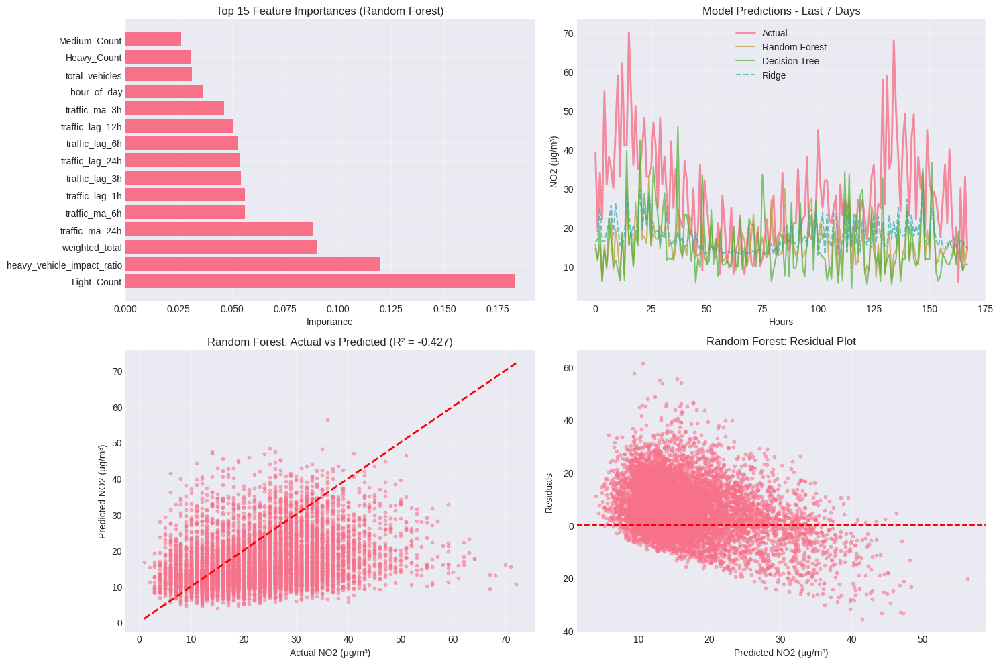


MODEL PERFORMANCE SUMMARY
           Model        R²       MAE      RMSE
   Random Forest -0.427132  9.432905 12.092815
   Decision Tree -0.868422 10.933117 13.836709
Ridge Regression -0.164813  8.406618 10.925050


In [201]:
# train and evaluate models
best_model, feature_cols, performance_summary = evaluate_models_time_series(df_prepared)


TIME SERIES CROSS-VALIDATION
Performing 3-fold time series cross-validation...

Fold 1:
  RF - R²: -1.850, MAE: 14.37
  DT - R²: -2.105, MAE: 14.65

Fold 2:
  RF - R²: -0.042, MAE: 8.14
  DT - R²: -0.286, MAE: 8.93

Fold 3:
  RF - R²: -0.306, MAE: 9.05
  DT - R²: -0.430, MAE: 9.37

----------------------------------------
CROSS-VALIDATION SUMMARY
----------------------------------------

RandomForest:
  R²:  -0.733 ± 0.797
  MAE: 10.52 ± 2.75

DecisionTree:
  R²:  -0.940 ± 0.826
  MAE: 10.98 ± 2.60


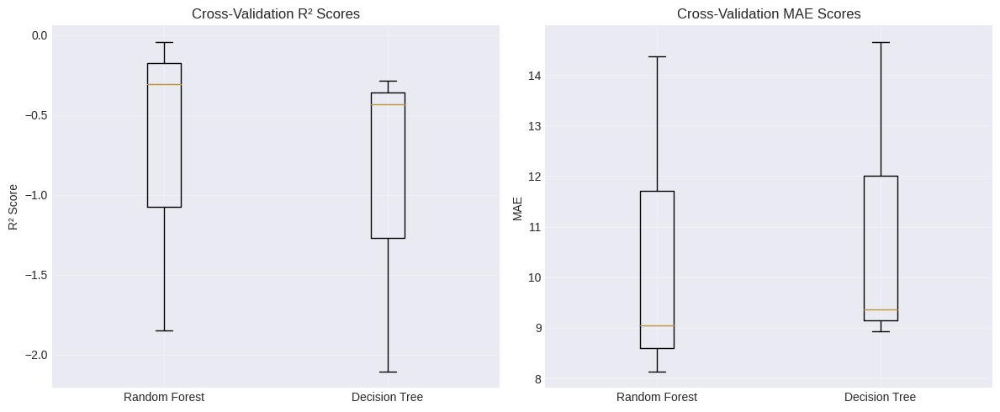

In [202]:
# cross validation of dataset
cv_results = cross_validate_time_series(df_prepared, n_splits=3)